In [1]:
import numpy as np
import os
import random
import cv2
from google.colab.patches import cv2_imshow
from google.colab import drive
import matplotlib.pyplot as plt

In [3]:
INPUT_LAYER_NEURON = 76800
HIDDEN_LAYER_NEURON = 50
OUTPUT_LAYER_NEURON = 3

class MultiLayeredPerceptronWeights:
  def __init__(self):
    #define theta between input and hidden layer
    self.theta_input_hidden = np.empty([INPUT_LAYER_NEURON, HIDDEN_LAYER_NEURON])
    self.bias_input_hidden = np.empty(HIDDEN_LAYER_NEURON)
    #define theta between hidden and output layer
    self.theta_hidden_output = np.empty([HIDDEN_LAYER_NEURON, OUTPUT_LAYER_NEURON])
    self.bias_hidden_output = np.empty(OUTPUT_LAYER_NEURON)

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


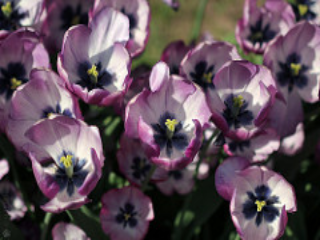

[0 0 1] 



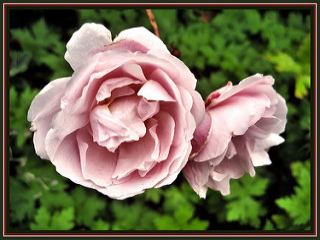

[0 1 0] 



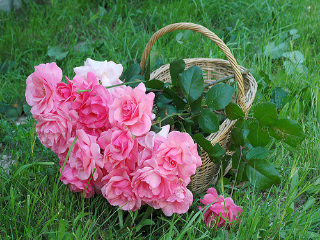

[0 1 0] 



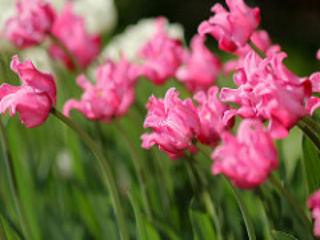

[0 0 1] 



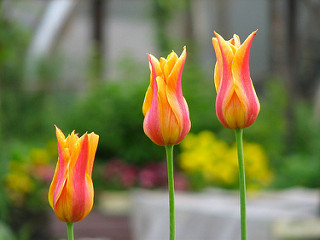

[0 0 1] 



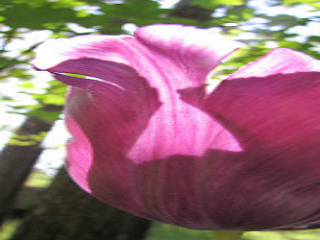

[0 0 1] 



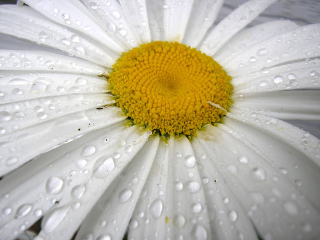

[1 0 0] 



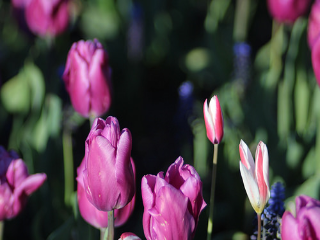

[0 0 1] 



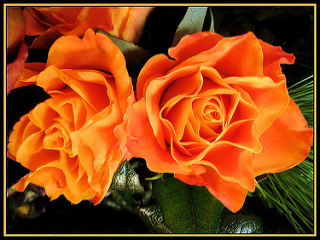

[0 1 0] 



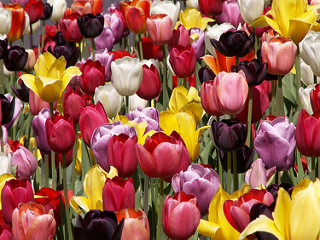

[0 0 1] 



In [5]:
def parse_dataset(folder_path):
  dataset = []
  for label in os.listdir(folder_path):
    label_path = os.path.join(folder_path, label)
    for data in os.listdir(label_path):
      data_path = os.path.join(label_path, data)
      if label == 'daisy':
        label_encoded = np.array([1, 0, 0])
      elif label == 'rose':
        label_encoded = np.array([0, 1, 0])
      else:
        label_encoded = np.array([0, 0, 1])
      dataset.append((label_encoded, data_path))
  return dataset

#parse dataset training dan testing
train_dataset_paths = parse_dataset('/content/drive/MyDrive/flowers_dataset_training')
test_dataset_paths = parse_dataset('/content/drive/MyDrive/flowers_dataset_testing')

#shuffle the data
random.shuffle(train_dataset_paths)
random.shuffle(test_dataset_paths)

#visualization
for label, data_path in train_dataset_paths[:10]:
  data = cv2.resize(cv2.imread(data_path), (320, 240))
  cv2_imshow(data)
  print(label, '\n')

In [6]:
#Grayscale
def grayscale(img):
  img = cv2.resize(img, (320, 240))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = img.flatten()
  return img

train_dataset = [(label, grayscale(cv2.imread(img_path))) for label, img_path in train_dataset_paths]
test_dataset = [(label, grayscale(cv2.imread(img_path))) for label, img_path in test_dataset_paths]

In [7]:
import numpy as np

def sigmoid(x):
  return 1/(1 + np.exp(-x))

In [8]:
def initialize(model):
  #Initializing weight and bias for hidden layer
  #theta between input and hidden layer
  model.theta_input_hidden = np.random.normal(0, 2/INPUT_LAYER_NEURON, (INPUT_LAYER_NEURON, HIDDEN_LAYER_NEURON))
  model.bias_input_hidden = np.random.normal(0, 2/INPUT_LAYER_NEURON, HIDDEN_LAYER_NEURON)
  #theta between hidden and input layer
  model.theta_hidden_output = np.random.normal(0, 2/HIDDEN_LAYER_NEURON, (HIDDEN_LAYER_NEURON, OUTPUT_LAYER_NEURON))
  model.bias_hidden_output = np.random.normal(0, 2/HIDDEN_LAYER_NEURON, OUTPUT_LAYER_NEURON)

In [9]:
def calc_err(label, output):
  return  ((output - label)**2)/2

In [10]:
def calc_output(input, model):
  hidden_y = sigmoid(np.dot(input, model.theta_input_hidden) + model.bias_input_hidden)
  output_y = sigmoid(np.dot(hidden_y, model.theta_hidden_output) + model.bias_hidden_output)

  #calculate the output of hidden layer
  return output_y, hidden_y

In [11]:
def update_weight(label, input, model, learning_rate):
  output_y, hidden_y = calc_output(input, model)
  
  #reshape and transpose to find the dot product
  hidden_y = hidden_y.reshape((len(hidden_y), 1))
  output_y = output_y.reshape((1, len(output_y)))
  input_reshaped = input.reshape((len(input), 1))

  #calculate error
  output_error = calc_err(label, output_y)

  #calculate dtheta between hidden and output layer
  derivative_hidden_output = (output_y - label) * output_y * (1 - output_y)
  dtheta_hidden_output = np.dot(hidden_y, derivative_hidden_output)
  
  #calculate dtheta between input and hidden layer
  hidden_error = np.dot(model.theta_hidden_output, derivative_hidden_output.T)
  derivative_input_hidden = hidden_error * hidden_y * (1 - hidden_y)
  derivative_input_hidden = derivative_input_hidden.reshape((1, len(derivative_input_hidden)))
  dtheta_input_hidden = np.dot(input_reshaped, derivative_input_hidden)

  # update theta
  model.theta_hidden_output -= learning_rate * dtheta_hidden_output / len(train_dataset)
  model.bias_hidden_output -= learning_rate * derivative_hidden_output[0] / len(train_dataset)
  model.theta_input_hidden -= learning_rate * dtheta_input_hidden / len(train_dataset)
  model.bias_input_hidden -= learning_rate * derivative_input_hidden[0] / len(train_dataset)

  # return the new total of the error
  return np.sum(calc_err(label, calc_output(input, model)[0]))

In [12]:
def predict(input, model):
  output, _ = calc_output(input, model)
  return np.argmax(output)

In [13]:
def calc_accuracy(model):
  correct_count = 0
  for label, data in test_dataset:
    if np.argmax(label) == predict(data, model):
      correct_count += 1
  return correct_count / len(test_dataset)

In [14]:
def train(model, epoch, learning_rate):
  print("\n\nTraining model; epoch =", epoch, "; learning_rate =", learning_rate)
  errors = []
  accuracies = []
  prev_log_string = ''
  for cur_epoch in range(epoch):
    total_error = 0
    for data_index, (label, data) in enumerate(train_dataset):
      cur_error = update_weight(label, data, model, learning_rate)
      total_error += cur_error
      #log progress of the training
      print('\b' * len(prev_log_string), end='')
      #current log progress
      prev_log_string = f'EPOCH {cur_epoch + 1}/{epoch}, DATA {data_index}/{len(train_dataset)}'
      if len(errors) > 0:
        prev_log_string += f', MODEL_ERROR: {errors[-1]}'
      print(prev_log_string, end='')
    errors.append(total_error/len(train_dataset))
    #print(total_error/len(train_dataset))
    accuracies.append(calc_accuracy(model))
  print("TRAINING FINISHED")
  return errors, accuracies



Training model; epoch = 50 ; learning_rate = 0.1
EPOCH 1/50, DATA 0/577EPOCH 1/50, DATA 1/577EPOCH 1/50, DATA 2/577

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


EPOCH 1/50, DATA 3/577EPOCH 1/50, DATA 4/577EPOCH 1/50, DATA 5/577EPOCH 1/50, DATA 6/577EPOCH 1/50, DATA 7/577EPOCH 1/50, DATA 8/577EPOCH 1/50, DATA 9/577EPOCH 1/50, DATA 10/577EPOCH 1/50, DATA 11/577EPOCH 1/50, DATA 12/577EPOCH 1/50, DATA 13/577EPOCH 1/50, DATA 14/577EPOCH 1/50, DATA 15/577EPOCH 1/50, DATA 16/577EPOCH 1/50, DATA 17/577EPOCH 1/50, DATA 18/577EPOCH 1/50, DATA 19/577EPOCH 1/50, DATA 20/577EPOCH 1/50, DATA 21/577EPOCH 1/50, DATA 22/577EPOCH 1/50, DATA 23/577EPOCH 1/50, DATA 24/577EP

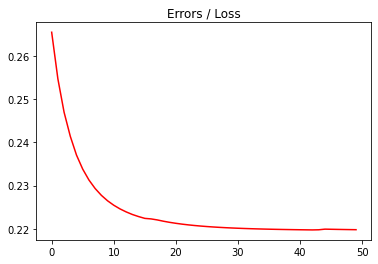

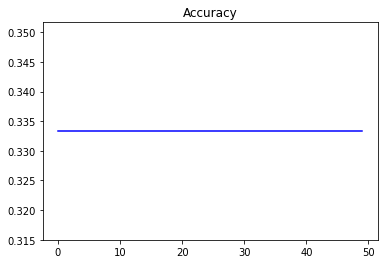



Training model; epoch = 50 ; learning_rate = 0.8
EPOCH 1/50, DATA 0/577EPOCH 1/50, DATA 1/577EPOCH 1/50, DATA 2/577EPOCH 1/50, DATA 3/577EPOCH 1/50, DATA 4/577EPOCH 1/50, DATA 5/577EPOCH 1/50, DATA 6/577EPOCH 1/50, DATA 7/577EPOCH 1/50, DATA 8/577EPOCH 1/50, DATA 9/577EPOCH 1/50, DATA 10/577EPOCH 1/50, DATA 11/577EPOCH 1/50, DATA 12/577EPOCH 1/50, DATA 13/577EPOCH 1/50, DATA 14/577EPOCH 1/50, DATA 15/577EPOCH 1/50, DATA 16/577EPOCH 1/50, DATA 17/577EPOCH 1/50, DATA 18/577EPOCH 1/50, DATA 19/577EPOCH 1/50, DATA 20/577EPO

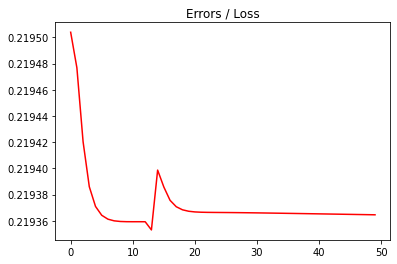

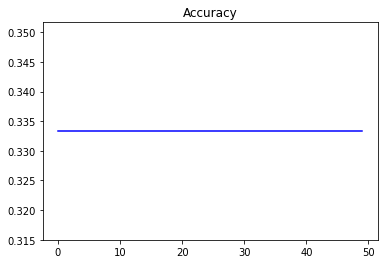

In [15]:
def visualize(errors, accuracies):
  plt.title("Errors / Loss")
  plt.plot(errors, 'r-')
  plt.show()
  plt.title("Accuracy")
  plt.plot(accuracies, 'b-')
  plt.show()
 
#epoch=50 and learning rate=0,1
model_0_1 = MultiLayeredPerceptronWeights()
initialize(model_0_1)
errors_0_1, accuracies_0_1 = train(model_0_1, 50, 0.1)
visualize(errors_0_1, accuracies_0_1)
 
#epoch=50 and learning rate=0,8
model_0_8 = MultiLayeredPerceptronWeights()
initialize(model_0_8)
errors_0_8, accuracies_0_8 = train(model_0_1, 50, 0.8)
visualize(errors_0_8, accuracies_0_8)